# Network Visualisation

## 0. Imports and Constants

In [1]:
import cv2
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms

In [2]:
INPUT_DIR = '../data/q2/'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
CLASS_NAMES = ['arctic fox', 'corgi', 'electric ray', 'goldfish', 'hammerhead shark', \
                'horse', 'hummingbird', 'indigo finch', 'puma', 'red panda']

MEAN = torch.tensor([0.485, 0.456, 0.406])
STD = torch.tensor([0.229, 0.224, 0.225])

def preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((224, 224)),
        transforms.Normalize(MEAN, STD)
    ])
    img_tensor = transform(img).unsqueeze(0).to(DEVICE)
    return img_tensor

def deprocess_image(tensor):
    tensor = tensor.clone().detach().cpu()
    tensor = tensor.squeeze()
    for t, m, s in zip(tensor, MEAN, STD):
        t.mul_(s).add_(m)
    tensor = tensor.clamp(0, 1)
    image = transforms.ToPILImage()(tensor)
    return image

In [4]:
model = models.resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 10)
model.load_state_dict(torch.load(f"{INPUT_DIR}/network_visualization.pth"))
model = model.eval().to(DEVICE)

In [5]:
image_paths_1 = [
    f"{INPUT_DIR}/network visualization/arctic fox/arctic fox_1.JPEG",
    f"{INPUT_DIR}/network visualization/corgi/corgi_1.JPEG",
    f"{INPUT_DIR}/network visualization/electric ray/electric ray_1.JPEG",
    f"{INPUT_DIR}/network visualization/goldfish/goldfish_1.JPEG",
    f"{INPUT_DIR}/network visualization/hammerhead shark/hammerhead shark_1.JPEG",
    f"{INPUT_DIR}/network visualization/horse/horse_1.JPEG",
    f"{INPUT_DIR}/network visualization/hummingbird/hummingbird_1.JPEG",
    f"{INPUT_DIR}/network visualization/indigo finch/indigo finch_1.JPEG",
    f"{INPUT_DIR}/network visualization/puma/puma_1.JPEG",
    f"{INPUT_DIR}/network visualization/red panda/red panda_1.JPEG"
]
labels_1 = list(range(10))

In [6]:
image_paths_2 = [
    f"{INPUT_DIR}/network visualization/arctic fox/arctic fox_2.JPEG",
    f"{INPUT_DIR}/network visualization/corgi/corgi_2.JPEG",
    f"{INPUT_DIR}/network visualization/electric ray/electric ray_2.JPEG",
    f"{INPUT_DIR}/network visualization/goldfish/goldfish_2.JPEG",
    f"{INPUT_DIR}/network visualization/hammerhead shark/hammerhead shark_2.JPEG",
    f"{INPUT_DIR}/network visualization/horse/horse_2.JPEG",
    f"{INPUT_DIR}/network visualization/hummingbird/hummingbird_2.JPEG",
    f"{INPUT_DIR}/network visualization/indigo finch/indigo finch_2.JPEG",
    f"{INPUT_DIR}/network visualization/puma/puma_2.JPEG",
    f"{INPUT_DIR}/network visualization/red panda/red panda_2.JPEG"
]
labels_2 = list(range(10))

## 1. Saliency Maps

### 1.1 Classification on Original Images

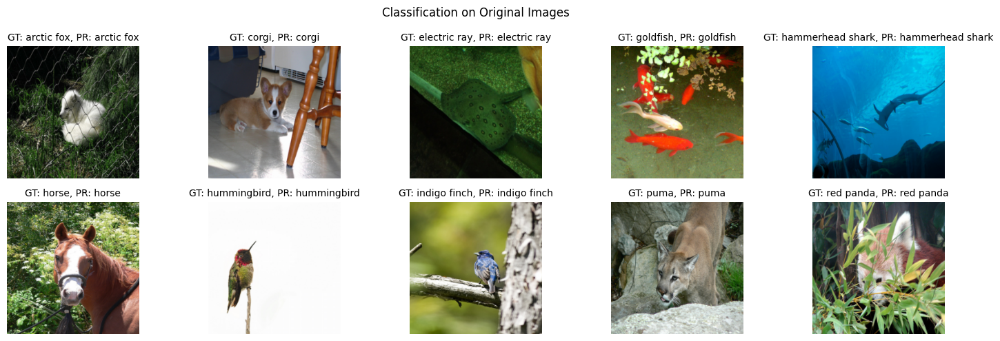

In [7]:
def predict_label(model, image_tensor):
    with torch.no_grad():
        output = model(image_tensor)
        _, predicted = torch.max(output, 1)
        return predicted.item()

def visualize_images(model, image_paths, labels):
    fig, axes = plt.subplots(len(image_paths) // 5, 5, figsize=(15, 5))
    fig.suptitle('Classification on Original Images')

    for i, image_path in enumerate(image_paths):
        img_tensor = preprocess_image(image_path)
        predicted_label = predict_label(model, img_tensor)
        axes[i // 5][i % 5].imshow(deprocess_image(img_tensor))
        axes[i // 5][i % 5].set_title(f"GT: {CLASS_NAMES[labels[i]]}, PR: {CLASS_NAMES[predicted_label]}", fontsize=10)
        axes[i // 5][i % 5].axis('off')

    plt.tight_layout()
    plt.show()

visualize_images(model, image_paths_1, labels_1)

### 1.2 Saliency Map

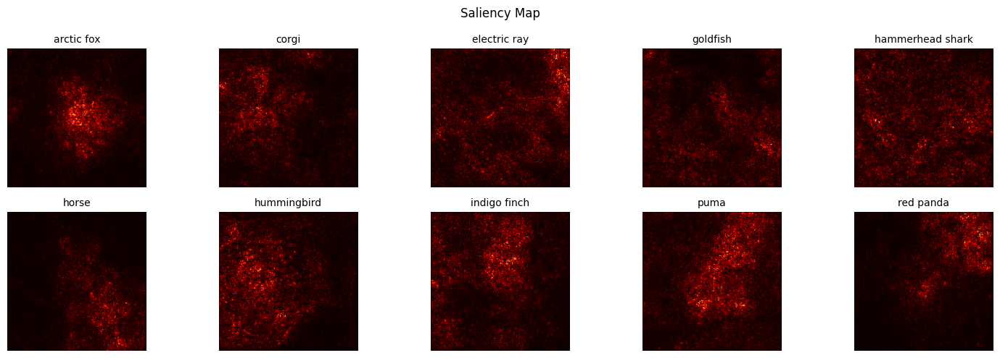

In [8]:
def compute_saliency_map(model, image_tensor, target_class):
    image_tensor.requires_grad_(True)
    output = model(image_tensor)
    logit = output[0, target_class]
    logit.backward()
    saliency = image_tensor.grad.abs().detach()
    saliency = torch.sum(saliency, dim=1, keepdim=True)
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency

def visualize_saliency_maps(model, image_paths, labels):
    fig, axes = plt.subplots(len(image_paths) // 5, 5, figsize=(15, 5))
    fig.suptitle('Saliency Map')

    for i, image_path in enumerate(image_paths):
        img_tensor = preprocess_image(image_path)
        saliency_map = compute_saliency_map(model, img_tensor, labels[i])
        axes[i // 5][i % 5].imshow(saliency_map.squeeze().cpu().numpy(), cmap='hot')
        axes[i // 5][i % 5].set_title(CLASS_NAMES[labels[i]], fontsize=10)
        axes[i // 5][i % 5].axis('off')

    plt.tight_layout()
    plt.show()

visualize_saliency_maps(model, image_paths_1, labels_1)

### 1.3 Classification on Masked Images

**Note:** The masking is done on the processed tensors, which are adjusted using the MEAN and STD values defined earlier. 

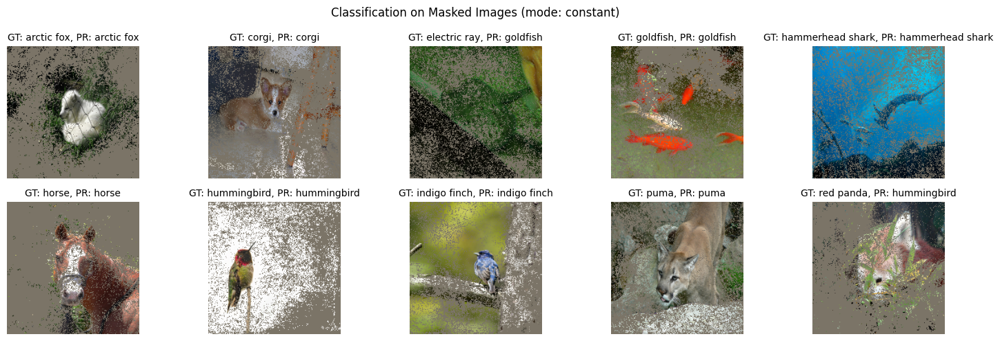

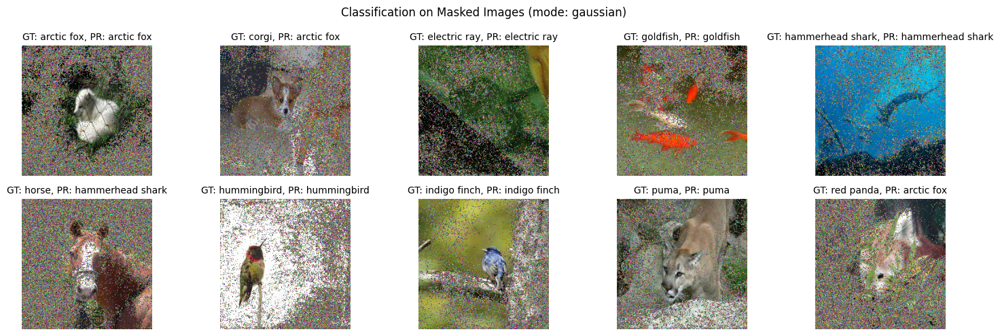

In [9]:
def modify_image_with_mask(image_tensor, saliency_map, threshold, mode):

    mask = (saliency_map < threshold).float()
    modified_image = image_tensor.clone().detach()

    if mode == 'constant':
        modified_image = modified_image * (1 - mask)
    elif mode == 'gaussian':
        noise = torch.randn_like(image_tensor)
        modified_image = modified_image * (1 - mask) + noise * mask
    else:
        raise ValueError("Invalid masking mode. Expected 'constant' or 'gaussian'.")

    return modified_image

def classify_modified_images(model, image_paths, labels, threshold, mode):

    modified_images = []
    predicted_labels = []

    for i, image_path in enumerate(image_paths):
        img_tensor = preprocess_image(image_path)
        saliency_map = compute_saliency_map(model, img_tensor, labels[i])
        modified_images.append(modify_image_with_mask(img_tensor, saliency_map, threshold, mode))
        with torch.no_grad():
            output = model(modified_images[-1])
            _, predicted = torch.max(output, 1)
            predicted_labels.append(predicted.item())

    visualize_modified_images(modified_images, labels, predicted_labels, mode)

def visualize_modified_images(modified_images, labels, predicted_labels, mode):

    fig, axes = plt.subplots(len(modified_images) // 5, 5, figsize=(15, 5))
    fig.suptitle(f'Classification on Masked Images (mode: {mode})')

    for i, modified_image in enumerate(modified_images):
        img = deprocess_image(modified_image)
        axes[i // 5][i % 5].imshow(img)
        axes[i // 5][i % 5].set_title(f"GT: {CLASS_NAMES[labels[i]]}, PR: {CLASS_NAMES[predicted_labels[i]]}", fontsize=10)
        axes[i // 5][i % 5].axis('off')

    plt.tight_layout()
    plt.show()

threshold = 0.03
classify_modified_images(model, image_paths_1, labels_1, threshold, 'constant')
classify_modified_images(model, image_paths_1, labels_1, threshold, 'gaussian')

**Qn. Does the model misclassify these images? Why or why not?**

**Answer:**

- The model misclassifies on 2 and 3 images respectively in the two cases.

- This number increases as we increase the value of threshold for the pixels to retain.

- This could be attributed to two reasons.
    1. The individual pixels may have low gradient, but several such pixels in total may have a significant contribution in the decision making.
    2. The model may find some patterns in the constant or noisy patches added to the image, or in the combination of these patches with the original regions of the image.

## 2. Fooling the Network

### 2.1 Classification on Noisy Images

Accuracy with noise std 0.15: 100.00%


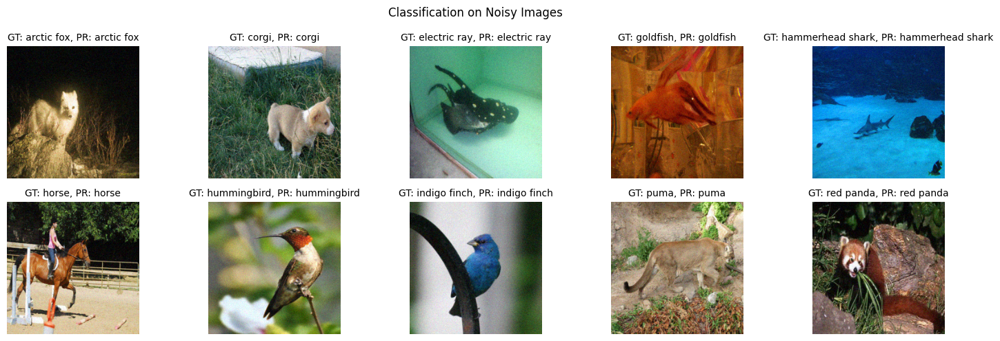

In [10]:
def test_accuracy_with_noise(model, image_paths, labels, noise_std):

    correct = 0
    noisy_images = []
    predicted_labels = []

    for i, image_path in enumerate(image_paths):
        img_tensor = preprocess_image(image_path)
        noise = torch.randn_like(img_tensor) * noise_std
        noisy_images.append(img_tensor + noise)
        with torch.no_grad():
            output = model(noisy_images[-1])
            _, predicted = torch.max(output, 1)
            predicted_labels.append(predicted.item())
            if predicted_labels[-1] == labels[i]:
                correct += 1

    accuracy = 100 * correct / len(image_paths)
    print(f"Accuracy with noise std {noise_std}: {accuracy:.2f}%")

    visualize_noisy_images(noisy_images, labels, predicted_labels)

def visualize_noisy_images(noisy_images, labels, predicted_labels):

    fig, axes = plt.subplots(len(noisy_images) // 5, 5, figsize=(15, 5))
    fig.suptitle(f'Classification on Noisy Images')

    for i, noisy_image in enumerate(noisy_images):
        img = deprocess_image(noisy_image)
        axes[i // 5][i % 5].imshow(img)
        axes[i // 5][i % 5].set_title(f"GT: {CLASS_NAMES[labels[i]]}, PR: {CLASS_NAMES[predicted_labels[i]]}", fontsize=10)
        axes[i // 5][i % 5].axis('off')

    plt.tight_layout()
    plt.show()

noise_std = 0.15
test_accuracy_with_noise(model, image_paths_2, labels_2, noise_std)

**Qn. Does the image still visually appear the same?**

**Answer:**

- The images look a bit noisy, subject to the scale or standard deviation of the normal noise added.

- The noise pattern looks the same throughout the image, since they are not targeted in specific regions of the image.

### 2.2 Classification on Adversarial Images

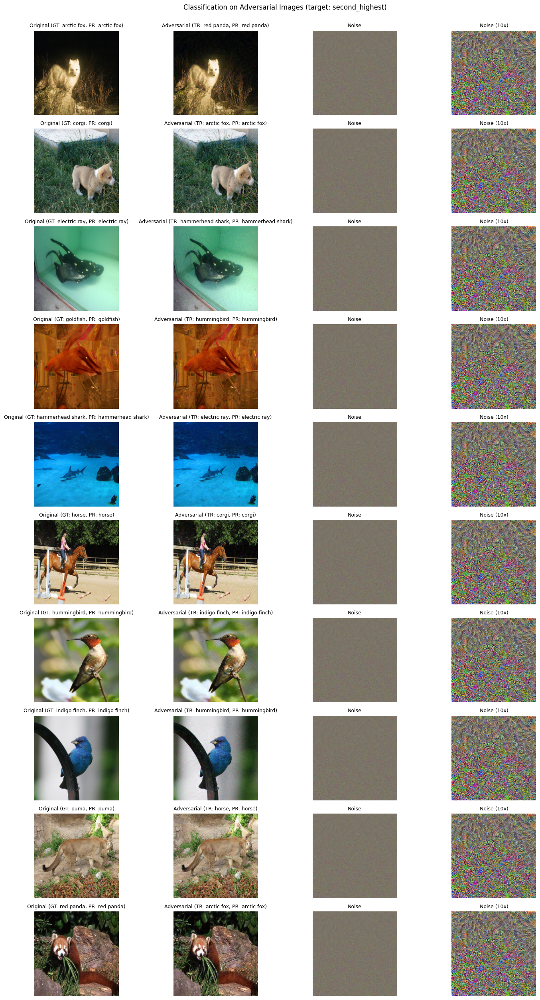

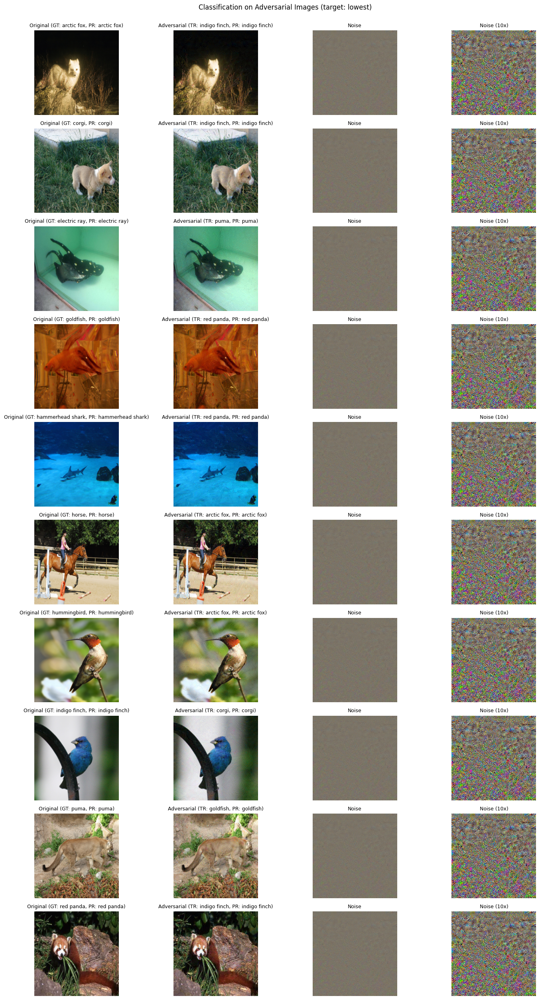

In [12]:
def create_adversarial_image(model, image_tensor, target_class, lr=0.01, epochs=25):

    adversarial_image = image_tensor.clone().detach().requires_grad_(True)
    optimizer = torch.optim.Adam([adversarial_image], lr=lr)

    for epoch in range(epochs):
        optimizer.zero_grad()
        output = model(adversarial_image)
        loss = -output[0, target_class]
        loss.backward()
        optimizer.step()

    return adversarial_image.detach()

def generate_adversarial_examples(model, image_paths, labels, target):

    original_images = []
    adversarial_images = []
    noise_images = []
    predicted_labels = []
    target_labels = []
    predicted_labels_adv = []

    for i, image_path in enumerate(image_paths):
        img_tensor = preprocess_image(image_path)

        with torch.no_grad():
            output = model(img_tensor)
            probabilities = torch.nn.functional.softmax(output[0], dim=0)
            _, predicted = torch.max(output, 1)
            predicted_label = predicted.item()
            sorted_probabilities, sorted_indices = torch.sort(probabilities, descending=True)
            if target == 'second_highest':
                target_class = sorted_indices[1].item()
            elif target == 'lowest':
                target_class = sorted_indices[-1].item()
            else:
                raise ValueError(f"Unrecognised argument {target} for target. Expected 'second_highest' or 'lowest'")

        adversarial_image = create_adversarial_image(model, img_tensor, target_class)
        with torch.no_grad():
            output_adv = model(adversarial_image)
            _, predicted_adv = torch.max(output_adv, 1)
            predicted_adv = predicted_adv.item()
        noise_adv = adversarial_image - img_tensor

        original_images.append(img_tensor)
        adversarial_images.append(adversarial_image)
        noise_images.append(noise_adv)
        predicted_labels.append(predicted_label)
        target_labels.append(target_class)
        predicted_labels_adv.append(predicted_adv)

    visualize_adversarial_examples(original_images, adversarial_images, noise_images, labels, predicted_labels, target_labels, predicted_labels_adv, target)

def visualize_adversarial_examples(original_images, adversarial_images, noise_images, labels, predicted_labels, target_labels, predicted_labels_adv, target):

    fig, axes = plt.subplots(len(original_images), 4, figsize=(15, 25))
    fig.suptitle(f'Classification on Adversarial Images (target: {target})', fontsize=12, y=1)

    for idx in range(len(original_images)):
        axes[idx][0].imshow(deprocess_image(original_images[idx]))
        axes[idx][0].set_title(f"Original (GT: {CLASS_NAMES[labels[idx]]}, PR: {CLASS_NAMES[predicted_labels[idx]]})", fontsize=9)
        axes[idx][0].axis('off')

        axes[idx][1].imshow(deprocess_image(adversarial_images[idx]))
        axes[idx][1].set_title(f"Adversarial (TR: {CLASS_NAMES[target_labels[idx]]}, PR: {CLASS_NAMES[predicted_labels_adv[idx]]})", fontsize=9)
        axes[idx][1].axis('off')

        axes[idx][2].imshow(deprocess_image(noise_images[0]))
        axes[idx][2].set_title("Noise", fontsize=9)
        axes[idx][2].axis('off')

        axes[idx][3].imshow(deprocess_image(noise_images[0] * 10))
        axes[idx][3].set_title("Noise (10x)", fontsize=9)
        axes[idx][3].axis('off')

    plt.tight_layout()
    plt.show()

generate_adversarial_examples(model, image_paths_2, labels_2, target='second_highest')
generate_adversarial_examples(model, image_paths_2, labels_2, target='lowest')

**Qn. Compare the final image for both of these cases and report any differences observed.**

**Answer:**

- The perturbations are too small and random looking for human eye to point out any significant difference.

- We still observe that the target labels are obtained as outputs in both the cases.

- Intuitively, we would expect the perturbations to be more intruding for the second case, where we are trying to improve the lowest probability.